In [1]:
import json
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import math
import matplotlib.image as mpimg
import matplotlib.patches as mpatches
from matplotlib import colors
import matplotlib.transforms as mtrans
import yaml
from yaml.loader import SafeLoader
from collections import OrderedDict
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.metrics import auc, roc_curve, roc_auc_score, accuracy_score
from sklearn.model_selection import cross_val_predict, train_test_split, cross_val_score, cross_validate
from sklearn.svm import LinearSVR, SVC
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
import seaborn as sns

/tmp/ipykernel_3516729/4096319321.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
# Release3 dHCP : select subjects from info dataframe

dir_Release3 = '/neurospin/grip/external_databases/dHCP_CR_JD_2018/Projects/denis/release3_scripts/subjects_file_v4.json'
with open(dir_Release3) as f:
    subjects_R3 = json.load(f)

subjects_R3 = list(subjects_R3.keys())

# get the session ids of R3
dir_sessions = '/neurospin/grip/external_databases/dHCP_CR_JD_2018/Projects/denis/release3_scripts/subjects_file_v4.json'
with open(dir_sessions) as f:
    dict_sessions = json.load(f)
sessions = [value['session_id'] for _, value in dict_sessions.items()]

# get dHCP info
dir_info_dHCP = '/home/jl277509/Documents/info_dHCP.tsv'
info_dHCP = pd.read_csv(dir_info_dHCP, usecols=['participant_id', 'birth_age', 'session_id'], sep='\t')
# filter over subjects
info_dHCP.drop(info_dHCP[~(info_dHCP['participant_id'].isin(subjects_R3))].index, inplace = True)
#info_dHCP.drop(info_dHCP[(info_dHCP['scan_number']!=1)].index, inplace = True) # not always scan 1
# filter over sessions
info_dHCP.drop(info_dHCP[~(info_dHCP['session_id'].isin(sessions))].index, inplace = True)
info_dHCP.reset_index(drop=True, inplace=True)

# Simple morphology pipeline

In [10]:
# let's visualize where morphometric parameters lend
# let's concatenate morpho data from each subject using the brainvisa files to make sure session is right
# subjects and session in info_dHCP

# let's make a csv for the sulcus and save it
sulcus = 'S.T.s._right'
morpho_params = ['hull_junction_length_talairach', 'maxdepth_talairach', 'GM_thickness', 'opening', 'meandepth_talairach', 'surface_talairach']
morpho_save = '/neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/morphometry/'

In [11]:
# no need to use StandardScaler as it is already used in embeddings pipeline
stdscaler = StandardScaler()

In [12]:
# load morpho params for each subject, concatenate and save df

morpho_df = pd.DataFrame(columns=morpho_params)

for idx, (id, session, _) in info_dHCP.iterrows():
    morpho_dir = f'/neurospin/grip/external_databases/dHCP_CR_JD_2018/Projects/denis/release3_morpho_bids/sub-{id}/ses-{session}/anat/t1mri/default_acquisition/default_analysis/folds/3.1/default_session_auto/{id}_default_session_auto_sulcal_morphometry.csv'
    morpho = pd.read_csv(morpho_dir, sep=';')
    morpho_sulcus = morpho.loc[morpho['sulcus']==sulcus][morpho_params]
    morpho_df = morpho_df.append(morpho_sulcus)

morpho_df.to_csv(morpho_save+sulcus+'_morpho.csv', index=False)

AttributeError: 'DataFrame' object has no attribute 'append'

In [13]:
# load df
morpho_df = pd.read_csv(morpho_save+sulcus+'_morpho.csv')
#X = stdscaler.fit_transform(morpho_df)
#morpho_df[morpho_df.columns]=X
df_morpho = pd.concat([info_dHCP, morpho_df.set_index(info_dHCP.index)], axis=1)

In [14]:
# save data in full_embeddings of a random model, just so embeddings pipeline can be used

embeddings_morpho = df_morpho[morpho_params]
embeddings_morpho.to_csv('/neurospin/dico/jlaval/Runs/01_deep_supervised/Program/Output/morpho/morpho_params/STs_dHCP_374_subjects_embeddings/full_embeddings.csv', sep=',', index=False)

OSError: Cannot save file into a non-existent directory: '/neurospin/dico/jlaval/Runs/01_deep_supervised/Program/Output/morpho/morpho_params/STs_dHCP_374_subjects_embeddings'

# Old morphology pipeline (more features)

In [15]:
# use this dataframe to retrieve session in older morphometry pipeline using common metrics ...
morpho_old = pd.read_csv(f'/neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/morphometry/morphometry_statistics/right/morpho_{sulcus}.dat', sep=' ')


In [16]:
# use hull junction length value and keep only equal values
for idx, row in morpho_old.iterrows():
    if df_morpho.loc[df_morpho['participant_id']==row['subject']].shape[0]==0:
        morpho_old.drop(idx, inplace=True)
    elif row['hullJunctionsLength'] != df_morpho.loc[df_morpho['participant_id']==row['subject']].hull_junction_length_talairach.tolist()[0]:
        morpho_old.drop(idx, inplace=True)

In [17]:
# add geodesic length / length parameter for shape description

# define a folding measure as length / (extremity1 - extremity2)
length = morpho_old['hullJunctionsLength'].to_numpy()
extremity1 = morpho_old[['extremity1x', 'extremity1y', 'extremity1z']].to_numpy()
extremity2 = morpho_old[['extremity2x', 'extremity2y', 'extremity2z']].to_numpy()
coords = extremity1-extremity2
d = np.sqrt(np.square(coords[:,0]) + np.square(coords[:,1]) + np.square(coords[:,2]))

foldness = (length - d) / length

morpho_old['SulcusLength']=d # probably not used ?
morpho_old['foldness']=foldness

In [71]:
# first positional measures
posi_params = ['gravityCenter_x', 'gravityCenter_y', 'gravityCenter_z',
               'normal_x', 'normal_y', 'normal_z',
               'direction_x', 'direction_y', 'direction_z']

cols = [f'dim{k}' for k in range(1,len(posi_params)+1)]
print(f'nb params: {len(cols)}')

embeddings = morpho_old[['subject']+posi_params]
embeddings.columns=['ID']+cols
#X = stdscaler.fit_transform(embeddings[cols])
#embeddings[cols]=X


embeddings.to_csv(morpho_save+sulcus+'_positional.csv', sep=',', index=False)
# then copy this in a model directory as embeddings_full.csv in order to use it in embeddings pipeline

nb params: 9


In [72]:
## SVC morpho shape extreme vs fullterm
preterm_labels = pd.read_csv('/neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/preterm_labels_23-28_vs_fullterm_no_sub.csv')
preterm_labels = preterm_labels[['Subject', 'Preterm_23-28_vs_fullterm']]
preterm_labels.columns=['ID', 'label']
embbs = pd.merge(preterm_labels, embeddings, on='ID')
X = embbs[cols]
Y = embbs['label']
X = stdscaler.fit_transform(X)
model = SVC(kernel='linear', probability=True,
            max_iter=-1, random_state=0,
            C=1, class_weight='balanced')
model.fit(X, Y)
preds = model.predict(X)
auc = roc_auc_score(Y, preds)
print(auc)

0.8073342200266007


In [73]:
shape_params = ['surface', 'geodesicDepthMax', 'geodesicDepthMean', 'hullJunctionsLength',
                'connectedComponentsAllRels', 'connectedComponents', 'foldness']


cols = [f'dim{k}' for k in range(1,len(shape_params)+1)]
print(f'nb params: {len(cols)}')

embeddings = morpho_old[['subject']+shape_params]
embeddings.columns=['ID']+cols
#X = stdscaler.fit_transform(embeddings[cols])
#embeddings[cols]=X

embeddings.to_csv(morpho_save+sulcus+'_shape.csv', sep=',', index=False)

nb params: 7


In [74]:
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score

In [76]:
## SVC morpho shape extreme vs fullterm
preterm_labels = pd.read_csv('/neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/preterm_labels_23-28_vs_fullterm_no_sub.csv')
preterm_labels = preterm_labels[['Subject', 'Preterm_23-28_vs_fullterm']]
preterm_labels.columns=['ID', 'label']
embbs = pd.merge(preterm_labels, embeddings, on='ID')
X = embbs[cols]
Y = embbs['label']
X = stdscaler.fit_transform(X)
model = SVC(kernel='linear', probability=True,
            max_iter=-1, random_state=0,
            C=1, class_weight='balanced')
model.fit(X, Y)
preds = model.predict(X)
auc = roc_auc_score(Y, preds)
print(auc)

0.9267528025840774


In [77]:
all_params = posi_params + shape_params

cols = [f'dim{k}' for k in range(1,len(all_params)+1)]
print(f'nb params: {len(cols)}')

embeddings = morpho_old[['subject']+all_params]
#embeddings.to_csv('/neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/crops/2mm/S.T.s.baby/mask/morpho_labels.csv', index=False)
embeddings.columns=['ID']+cols
#X = stdscaler.fit_transform(embeddings[cols])
#embeddings[cols]=X

embeddings.to_csv(morpho_save+sulcus+'_all.csv', sep=',', index=False)

nb params: 16


In [78]:
## SVC morpho shape extreme vs fullterm
preterm_labels = pd.read_csv('/neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/preterm_labels_23-28_vs_fullterm_no_sub.csv')
preterm_labels = preterm_labels[['Subject', 'Preterm_23-28_vs_fullterm']]
preterm_labels.columns=['ID', 'label']
embbs = pd.merge(preterm_labels, embeddings, on='ID')
X = embbs[cols]
Y = embbs['label']
X = stdscaler.fit_transform(X)
model = SVC(kernel='linear', probability=True,
            max_iter=-1, random_state=0,
            C=1, class_weight='balanced')
model.fit(X, Y)
preds = model.predict(X)
auc = roc_auc_score(Y, preds)
print(auc)

0.983754512635379


In [18]:
# command to copy embeddings in directory for embeddings pipeline
"""
cp /neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/morphometry/S.T.s._right_all.csv /neurospin/dico/jlaval/Runs/01_deep_supervised/Program/Output/morpho/morpho_all/STs_dHCP_374_subjects_embeddings/full_embeddings.csv
"""

'\ncp /neurospin/dico/data/deep_folding/current/datasets/dHCP_374_subjects/morphometry/S.T.s._right_all.csv /neurospin/dico/jlaval/Runs/01_deep_supervised/Program/Output/morpho/morpho_all/STs_dHCP_374_subjects_embeddings/full_embeddings.csv\n'

# Manhattan plot of correlations with birth age

In [19]:

correl = {'Pearson correlation coefficient': [], 'p-value': []}
info_dHCP.columns=['subject', 'session_id', 'birth_age']
morpho_old_ = pd.merge(info_dHCP, morpho_old[['subject']+all_params])
#morpho_old_ = morpho_old_.drop(morpho_old_[morpho_old_['birth_age']<=32].index)
#morpho_old_ = morpho_old_.drop(morpho_old_[morpho_old_['birth_age']>=37].index)
for param in all_params:
    R, p = pearsonr(morpho_old_[param], morpho_old_['birth_age'])
    correl['Pearson correlation coefficient'].append(R)
    correl['p-value'].append(p)
# apply Bonferroni correction # no because threshold is corrected in the plot
# correl['p-value']=np.array(correl['p-value'])*len(correl['p-value'])
# if using age thresholds, multiply by 4
correl['p-value']=4*np.array(correl['p-value'])

ValueError: array must not contain infs or NaNs

In [20]:
save_dir = '/home/jl274628/Documents/PLOT_RAPPORT/morpho/'

ValueError: could not broadcast input array from shape (15,) into shape (16,)

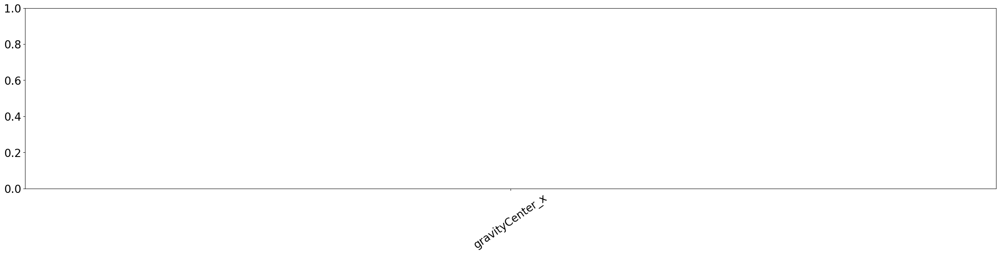

In [21]:
fig, ax = plt.subplots(figsize=(2*len(all_params), 6))

labelsize=20
plt.xticks(rotation=35)
ax.xaxis.set_tick_params(labelsize = labelsize)
ax.yaxis.set_tick_params(labelsize = labelsize)
nb_components = len(correl['p-value'])

markerline, stemlines, baseline = \
        ax.stem(all_params,
              -np.log10(correl['p-value']),
              bottom=-np.log10(np.max(correl['p-value'])),
              basefmt= 'C0',
              linefmt=':')
plt.setp(markerline, 'color', 'black')
plt.setp(stemlines, 'color', 'black')
plt.setp(baseline, 'color', 'black')
ax.plot(-np.log10(0.05/(nb_components))*np.ones(nb_components), c='black')
ax.set_ylabel("-log$_{10}$(p)", labelpad=5.0, fontsize=labelsize+2)
to_keep_1 = ax.set_xlabel("morphology parameters", labelpad=10.0, fontsize=labelsize+2)

ax.axline((8.5, 0), (8.5, 16), color='darkred', linestyle='--')

ax2 = ax.twinx()
ax2.xaxis.set_tick_params(labelsize = labelsize)
ax2.yaxis.set_tick_params(labelsize = labelsize)
ax2.plot(all_params, np.abs(correl['Pearson correlation coefficient']), c='blue')
ax2.set_ylim([0., 0.5])
ax2.set_ylabel('correlation coefficient', color='b', rotation=270, labelpad=25, fontsize=labelsize+2)
ax2.set_yticks([0., 0.25, 0.5])
ax2.spines['right'].set_color('blue')
ax2.tick_params(axis='y', colors='blue')
ax2.set_ylim(-0.08)

to_keep_2 = plt.text(x=0.5, y=0.94, s=f"Pearson correlation between birth age and morphometric parameters in dHCP", fontsize=labelsize+3, ha="center", transform=fig.transFigure)
plt.text(x=0.3, y=0.89, s="Positional", fontsize=labelsize+3, ha="center", transform=fig.transFigure, color='darkred')
plt.text(x=0.7, y=0.89, s="Shape", fontsize=labelsize+3, ha="center", transform=fig.transFigure, color='darkred')
#plt.savefig(save_dir + f'manhattan_plot_dHCP', facecolor='white', bbox_extra_artists=(to_keep_1, to_keep_2), bbox_inches='tight')
plt.show()

# Explore param values

In [16]:
# direction x is useless for STS...
length_dir = np.sqrt((morpho_old['direction_y'])**2+(morpho_old['direction_z'])**2)
print(np.mean(length_dir))

0.9957327134573043


## Investigate if extremities are faithfully computed

In [17]:
vect_dir = np.array(morpho_old[['direction_x', 'direction_y', 'direction_z']])
vect_extremity_diff = np.array(morpho_old[['extremity1x', 'extremity1y', 'extremity1z']]) - np.array(morpho_old[['extremity2x', 'extremity2y', 'extremity2z']])

In [18]:
def angle(v1, v2):
# v1 is your firsr vector
# v2 is your second vector
    angle = np.arccos(np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)))

    return(180*angle/np.pi)

angle_list = []
for v1, v2 in zip(vect_dir, vect_extremity_diff):
    alpha = angle(v1, v2)
    angle_list.append(alpha)

Text(0.5, 1.0, 'Angle between direction vector and extremities vector')

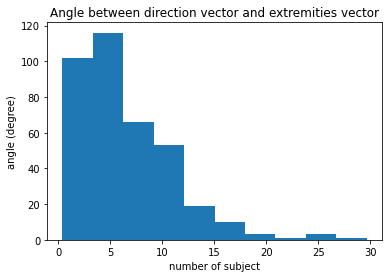

In [19]:
plt.hist(angle_list)
plt.xlabel('number of subject')
plt.ylabel('angle (degree)')
plt.title('Angle between direction vector and extremities vector')

# is this an indication that extremities are consistent with direction ? Maybe visu should be done

(array([ 0.,  3.,  3.,  4., 10., 20., 20., 19., 55., 53.]),
 array([-0.01 , -0.008, -0.006, -0.004, -0.002,  0.   ,  0.002,  0.004,
         0.006,  0.008,  0.01 ]),
 <BarContainer object of 10 artists>)

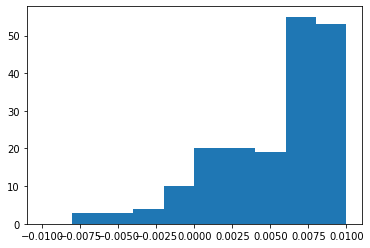

In [20]:
plt.hist(morpho_old['direction_x'] / (morpho_old['extremity1x'] - morpho_old['extremity2x']), range=(-0.01,0.01))

## Correlation matrix between morpho param and birth age

In [13]:
# select 155 subjects subset
subset_names_0 = pd.read_csv('/neurospin/dico/jlaval/data/dHCP_155/test_subject.csv', header=None)
subset_names_1 = pd.read_csv('/neurospin/dico/jlaval/data/dHCP_155/train_subject.csv', header=None)
subset_names_2 = pd.read_csv('/neurospin/dico/jlaval/data/dHCP_155/validation_subject.csv', header=None)
subset_names = subset_names_0[0].tolist() + subset_names_1[0].tolist() + subset_names_2[0].tolist()
embeddings = morpho_old[['subject']+all_params]
embeddings.columns=['ID']+all_params
embeddings['birth_age'] = info_dHCP['birth_age'].tolist()
df_corr = embeddings.loc[embeddings['ID'].isin(subset_names)]
df_corr = df_corr.drop('ID', axis=1)
#df_corr[df_corr.columns] = stdscaler.fit_transform(df_corr)

<AxesSubplot:>

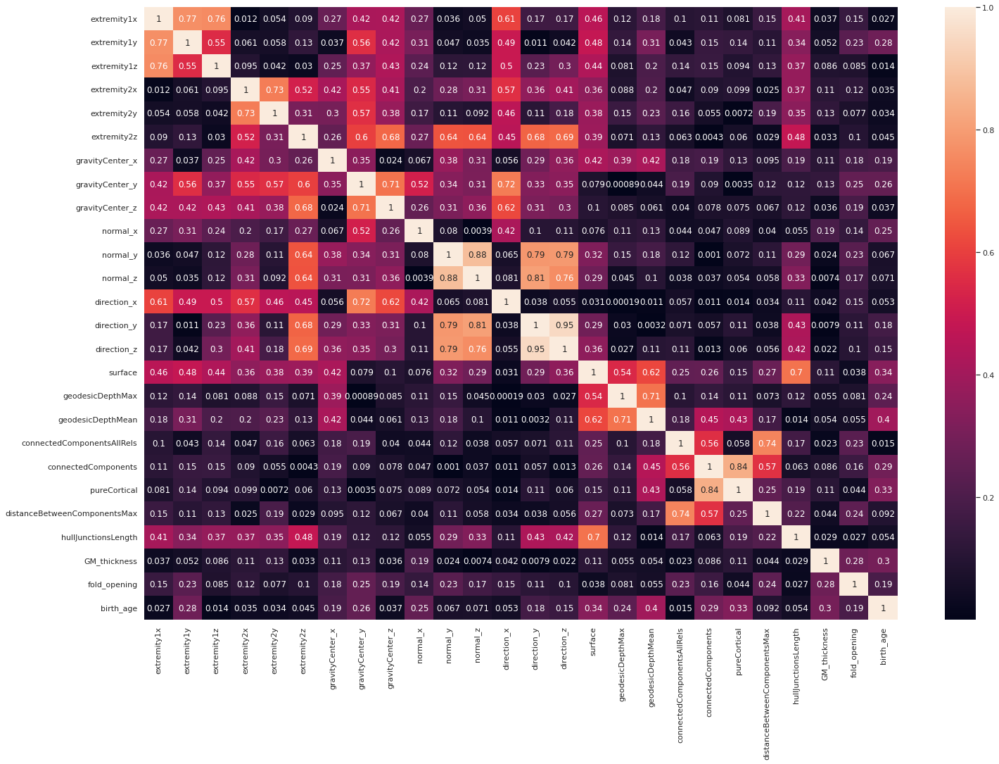

In [186]:
sns.set(rc={'figure.figsize':(24,16)})
sns.heatmap(np.abs(df_corr.corr()), annot=True)

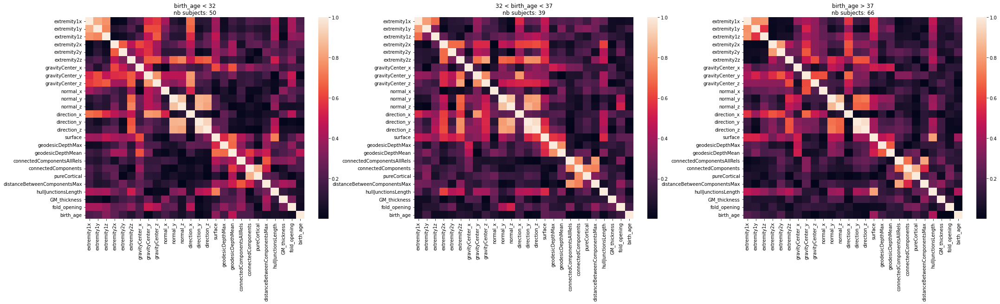

In [20]:
# visualize by age clusters : birth age better correlated to dims at low age
thresholds = [32,37]
fig, axs = plt.subplots(ncols=len(thresholds)+1, figsize=(12*(len(thresholds)+1),8))
for idx in range(len(thresholds)+1):
    if idx==0:
        df_subset = df_corr.loc[df_corr['birth_age']< thresholds[0]]
        age_range=f"birth_age < {thresholds[0]}"
    elif idx==len(thresholds):
        df_subset = df_corr.loc[df_corr['birth_age']>=thresholds[-1]]
        age_range=f"birth_age > {thresholds[-1]}"
    else:
        df_subset = df_corr.loc[(df_corr['birth_age']<thresholds[idx]) & (df_corr['birth_age']>=thresholds[idx-1])]
        age_range=f"{thresholds[idx-1]} < birth_age < {thresholds[idx]}"
    
    sns.heatmap(np.abs(df_subset.corr()), annot=False, ax=axs[idx])
    axs[idx].set_title(age_range+f'\nnb subjects: {df_subset.shape[0]}')

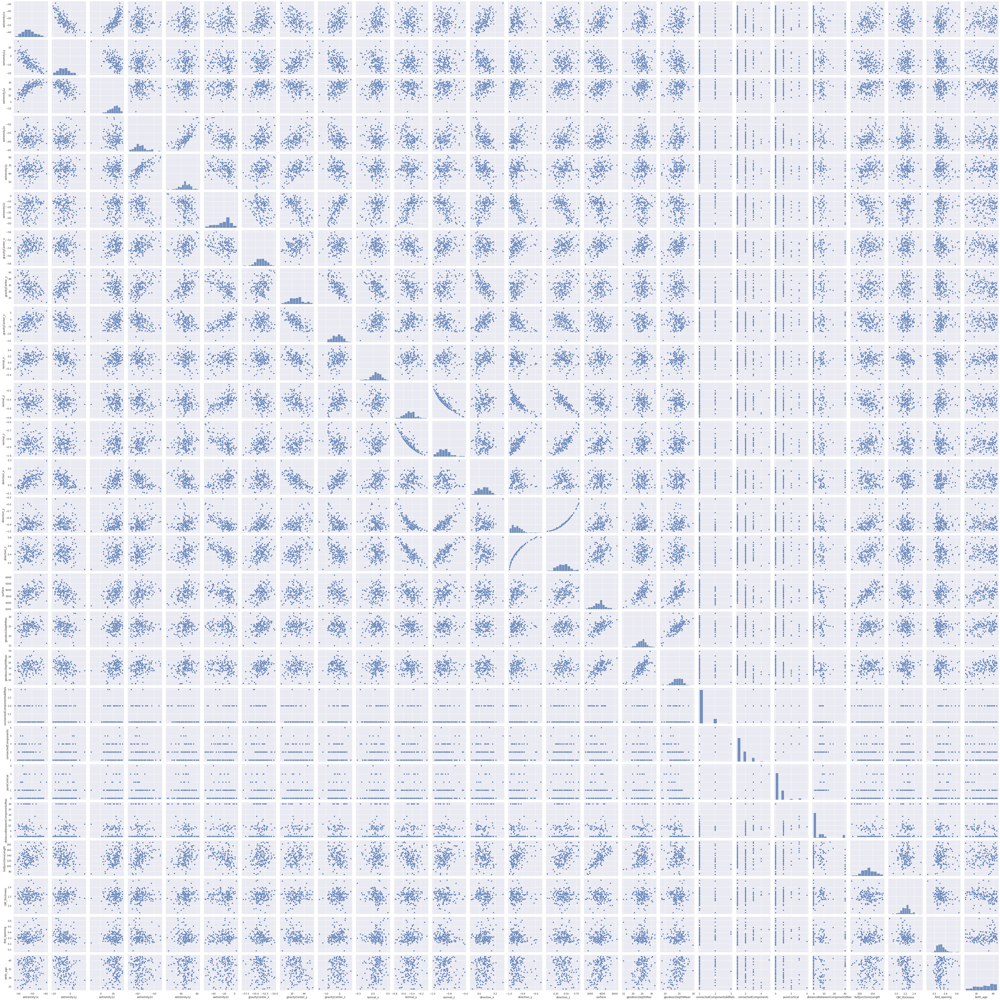

In [159]:
sns.pairplot(df_corr)

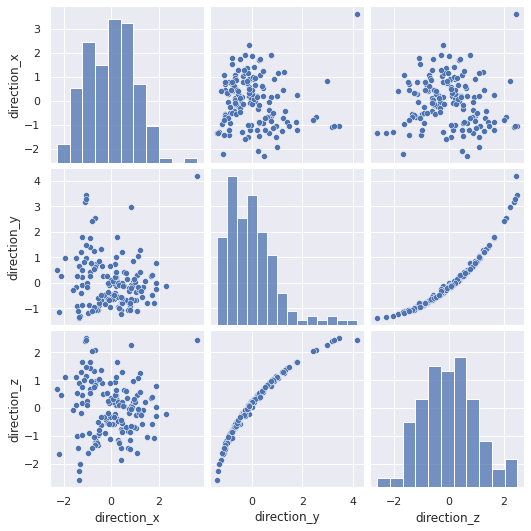

In [189]:
# some variables are obviously correlated ! # but not necessarily seen by correl value!
sns.pairplot(df_corr[['direction_x', 'direction_y', 'direction_z']])

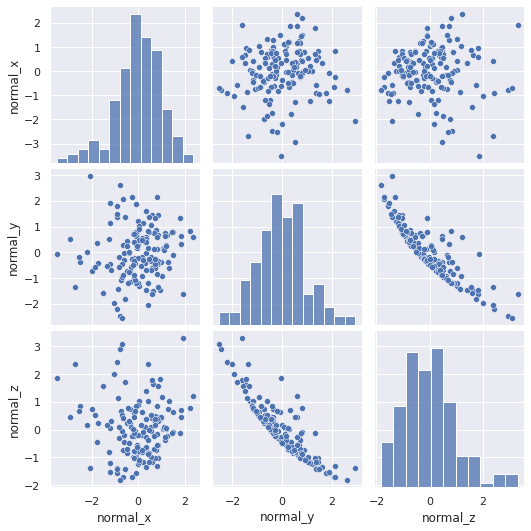

In [192]:
sns.pairplot(df_corr[['normal_x', 'normal_y', 'normal_z']])

In [14]:
# correlations between SimCLR embeddings and morpho params ? Especially the 0.6 correl...

# training on UKB (no post train)
dir = '/neurospin/dico/jlaval/Runs/01_deep_supervised/Program/Output/2023-06-15//14-36-49/STs_dHCP_374_subjects_embeddings/full_embeddings.csv'

SimCLR_embeddings = pd.read_csv(dir)
dims = [f'dim{k}' for k in range(1,11)]
SimCLR_embeddings.columns=['subject']+dims

## what is encoded in dimension 9 of SimCLR ?

In [15]:
shape_params = ['surface', 'geodesicDepthMax', 'geodesicDepthMean', 'connectedComponentsAllRels',
       'connectedComponents', 'pureCortical', 'distanceBetweenComponentsMax',
       'hullJunctionsLength', 'GM_thickness', 'fold_opening']

posi_params = ['extremity1x','extremity1y', 'extremity1z', 'extremity2x', 'extremity2y', 'extremity2z', 'gravityCenter_x',
               'gravityCenter_y', 'gravityCenter_z', 'normal_x', 'normal_y', 'normal_z', 'direction_x', 'direction_y', 'direction_z']

all_params = posi_params + shape_params

cols = [f'dim{k}' for k in range(1,len(all_params)+1)]

embeddings = morpho_old[['subject']+all_params]

all = pd.merge(embeddings, SimCLR_embeddings)

In [24]:
dim='dim9'

X = all[[dim]+all_params+['foldness']]

dict_corr = {}
x = all[dim]
for param in all_params:
    y = all[param]
    correl = pearsonr(x,y)
    if correl[1] < 0.05:
        dict_corr[param]=correl

# print only significant p-values
dict_corr

{'extremity1z': (-0.1962987528089817, 0.00013303726846244766),
 'gravityCenter_z': (-0.14266094376502395, 0.005712445360673153),
 'geodesicDepthMean': (-0.2855471878128953, 1.8964006346591617e-08),
 'connectedComponents': (0.16108292118584674, 0.0017768374937163246),
 'pureCortical': (0.15810477950311377, 0.0021645306196802516),
 'hullJunctionsLength': (0.17713393634132876, 0.0005787284650824935),
 'fold_opening': (-0.10398186489095008, 0.044470063072744065)}

(0.23973495069388545, 2.74152546569482e-06)

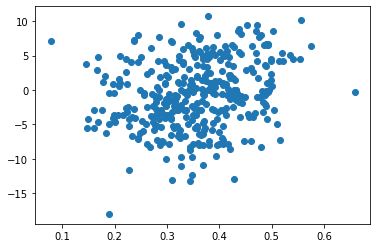

In [26]:
# correlation between foldness and dim 9
plt.scatter(foldness, x)
pearsonr(foldness, x)

In [19]:
threshold=32
age = info_dHCP[['participant_id', 'birth_age']]
age.columns=['subject', 'birth_age']
all_thresh = pd.merge(morpho_old, age)
all_thresh = pd.merge(all_thresh, SimCLR_embeddings)
all_thresh[['birth_age', 'dim9']+all_params]
all_thresh = all_thresh.loc[all_thresh['birth_age']<threshold]

dict_corr = {}
x = all_thresh[dim]
for param in all_params:
    y = all_thresh[param]
    correl = pearsonr(x,y)
    if correl[1] < 0.05:
        dict_corr[param]=correl

# print only significant p-values
dict_corr

{'extremity1x': (-0.34734917180577307, 0.010069512363651282),
 'extremity1y': (0.3652442375585702, 0.006613474475189666),
 'extremity1z': (-0.5322298788539968, 3.4400952873598564e-05),
 'gravityCenter_x': (-0.30127667034403377, 0.02684007116654008),
 'gravityCenter_z': (-0.3009800082204693, 0.026997852454971535),
 'surface': (-0.5782298923370248, 4.670407696025567e-06),
 'geodesicDepthMean': (-0.47795964233404414, 0.0002570696823258209),
 'connectedComponentsAllRels': (0.29747293004644565, 0.02892275418054649),
 'connectedComponents': (0.29079416040895534, 0.03290609942944572),
 'hullJunctionsLength': (-0.3114782508893779, 0.02186578414574971)}

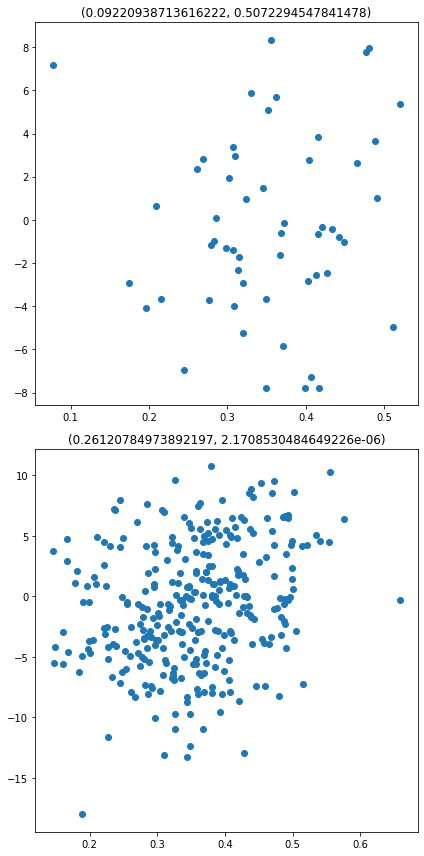

In [49]:
# correlation between foldness and dim 9
threshold=32
preterm = age['birth_age'].to_numpy() < threshold
fig, ax = plt.subplots(nrows=2, figsize=(6, 12))
foldness_ = foldness[np.where(preterm)]
x_ = x.to_numpy()[np.where(preterm)]
ax[0].scatter(foldness_, x_)
ax[0].set_title(pearsonr(foldness_, x_))

foldness_ = foldness[np.where(1-preterm)]
x_ = x.to_numpy()[np.where(1-preterm)]
ax[1].scatter(foldness_, x_)
pearsonr(foldness_, x_)
ax[1].set_title(pearsonr(foldness_, x_))
plt.tight_layout()

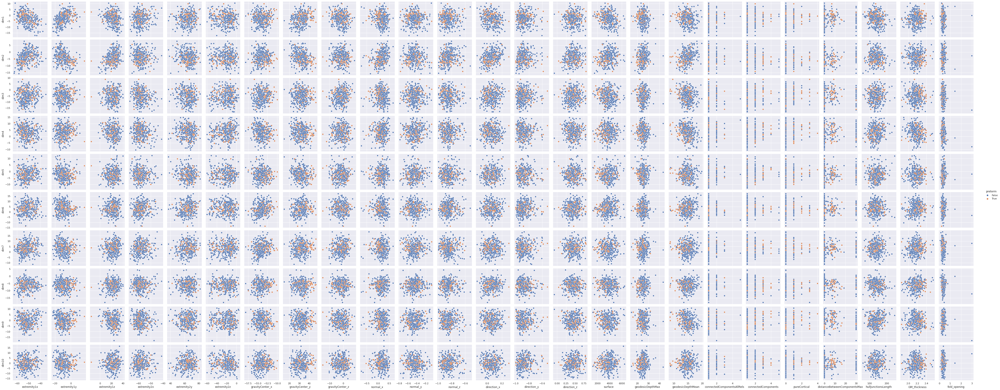

In [109]:
# summary for all dims
sns.set(rc={'figure.figsize':(len(dims)*6,len(all_params)*6)})

preterm = age['birth_age'].to_numpy() < threshold
all['preterm'] = preterm
figure = sns.pairplot(data=all,
             y_vars=dims,
             x_vars=all_params,
             hue="preterm")

In [148]:
# define a folding measure as length / (extremity1 - extremity2)
# NB: it appears not relevant!
length = all['hullJunctionsLength'].to_numpy()
extremity1 = all[['extremity1x', 'extremity1y', 'extremity1z']].to_numpy()
extremity2 = all[['extremity2x', 'extremity2y', 'extremity2z']].to_numpy()
coords = extremity1-extremity2
d = np.sqrt(np.square(coords[:,0]) + np.square(coords[:,1]) + np.square(coords[:,2]))

foldness = (length - d) / length

(array([ 1.,  2.,  4., 16., 17., 15.,  8.,  4.,  0.,  1.]),
 array([0.07724096, 0.13541585, 0.19359074, 0.25176563, 0.30994051,
        0.3681154 , 0.42629029, 0.48446518, 0.54264007, 0.60081495,
        0.65898984]),
 <BarContainer object of 10 artists>)

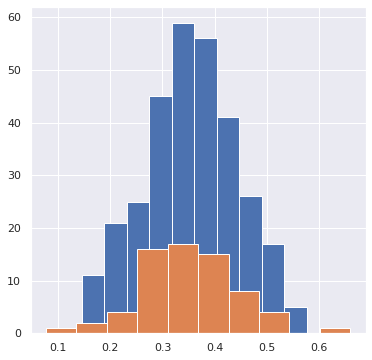

In [150]:
foldness_preterm = foldness[np.where(preterm)]
foldness_fullterm = foldness[np.where(1-preterm)]

fig, ax = plt.subplots(figsize=(6,6))
ax.hist(foldness_fullterm)
ax.hist(foldness_preterm)

Text(0, 0.5, 'foldness')

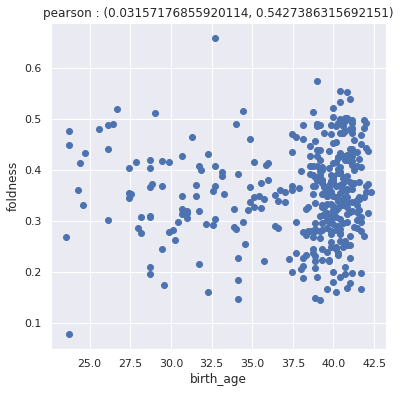

In [152]:
fig, ax = plt.subplots(figsize=(6,6))
X, Y = age['birth_age'].to_numpy(), foldness
ax.scatter(X, Y)
ax.set_title(f'pearson : {pearsonr(X, Y)}')
ax.set_xlabel('birth_age')
ax.set_ylabel('foldness')

Text(0, 0.5, 'foldness')

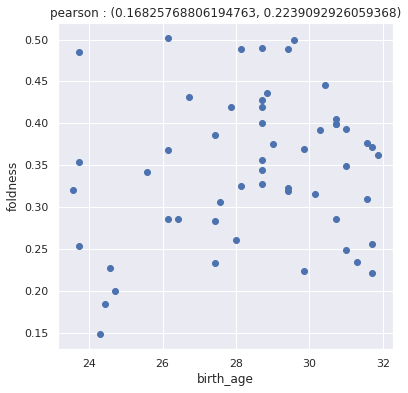

In [157]:
threshold = 32

fig, ax = plt.subplots(figsize=(6,6))
X, Y = age['birth_age'].to_numpy(), foldness
X = X[np.where(X < threshold)]
Y = Y[np.where(X < threshold)]
ax.scatter(X, Y)
ax.set_title(f'pearson : {pearsonr(X, Y)}')
ax.set_xlabel('birth_age')
ax.set_ylabel('foldness')

In [110]:
output_dir = '/home/jl274628/Images/'
fig = figure.get_figure()
fig.savefig(output_dir+'pairplot_SimCLR_morpho.png',facecolor='white')

<Figure size 4320x10800 with 0 Axes>

In [32]:
# test SVC

threshold=32

all_params = posi_params + shape_params

cols = [f'dim{k}' for k in range(1,len(all_params)+1)]
print(f'nb params: {len(cols)}')

embeddings = morpho_old[all_params]

X = stdscaler.fit_transform(embeddings)
Y = info_dHCP['birth_age'].to_numpy() < threshold

# SVC predict_proba
model = SVC(kernel='linear', probability=True, class_weight='balanced',
            max_iter=10000, random_state=0)

res = cross_validate(model, X, Y, cv=5, return_estimator=True, scoring='roc_auc')

nb params: 25


In [41]:
morpho_old[all_params]

,extremity1x,extremity1y,extremity1z,extremity2x,extremity2y,extremity2z,gravityCenter_x,gravityCenter_y,gravityCenter_z,normal_x,...,surface,geodesicDepthMax,geodesicDepthMean,connectedComponentsAllRels,connectedComponents,pureCortical,distanceBetweenComponentsMax,hullJunctionsLength,GM_thickness,fold_opening
1,-54.5720,-9.84447,19.64770,-59.2370,59.5623,-13.3195,-55.0329,25.1956,1.715060,0.279310,...,3222.21,23.24,13.2625,1,1,0,0.00000,126.86,2.16885,0.415798
2,-56.1663,-6.62794,5.58983,-52.9300,67.9507,-43.8668,-52.6895,36.3623,-7.506550,0.132250,...,3734.54,24.48,15.4913,1,2,1,7.03967,137.62,2.18501,0.340480
3,-48.2478,-13.18810,24.70070,-60.2409,64.3059,-30.1500,-52.4658,30.7848,-1.595590,0.140859,...,3757.16,29.52,18.3696,2,2,0,30.00000,129.46,2.19827,0.149484
4,-58.9132,7.23983,14.59360,-61.4123,57.4375,-28.6558,-53.9666,33.1129,-3.233840,0.219299,...,3383.46,24.68,12.9589,1,1,0,0.00000,129.58,2.02842,0.298484
5,-52.7921,-10.47250,21.44800,-58.2105,69.0653,-22.1589,-55.0408,32.7443,-3.696190,0.206331,...,2979.77,21.60,12.9493,1,1,0,0.00000,122.08,2.28747,0.204445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,-49.9758,-14.24920,20.70580,-51.0221,70.5813,-46.7634,-53.8215,35.4018,-5.735750,0.238381,...,4847.64,28.40,15.7789,1,1,0,0.00000,168.58,2.22339,0.487891
495,-52.5651,-14.23550,25.03140,-66.1862,49.0630,-13.0176,-53.9283,22.2272,-1.357990,0.384090,...,4292.77,31.54,17.9978,2,2,0,30.00000,110.78,2.09603,0.322577
496,-55.6537,-8.47900,13.75010,-55.2556,67.6952,-39.7895,-53.7426,38.6157,-8.233550,0.096240,...,4229.32,30.52,16.1614,1,2,1,1.32971,149.84,2.00769,0.413393
497,-53.0870,-13.24880,26.08390,-57.1267,63.9297,-35.1331,-53.4536,25.5433,-4.261620,0.304772,...,3794.80,24.98,15.1001,1,1,0,0.00000,135.28,2.10812,0.266750


In [35]:
coef_lists = [res['estimator'][k].coef_ for k in range(5)]
coefs = [np.mean([coef_lists[i][0][k] for i in range(5)]) for k in range(25)]
coefs = np.abs(coefs)
print(coefs)

[0.17691782 0.04190141 0.14733967 0.40385948 0.02254493 0.38213184
 0.85598604 0.83970138 0.00260024 0.45441264 0.01526839 0.14301959
 0.37318686 0.30783179 0.17524129 1.10093218 0.32243757 0.26712557
 0.57629678 0.60542284 0.10402308 0.07215511 0.27478823 0.2549435
 0.09110139]


In [34]:
print(res['test_score'])
print(np.mean(res['test_score']))

[0.93323864 0.85085227 0.984375   0.79261364 0.525     ]
0.8172159090909092


In [ ]:
# project STS tops on x axis
